In [1]:
#목표 : employee 특성을 분석하여 높은 임금을 받는 직원의 특성을 예측해보자
#데이터 - 교육수준 / 환경만족도 / 직업참여도 / 직업만족도 / 성과평가 / 관계만족도 / 워라밸

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (accuracy_score, log_loss, classification_report)
from imblearn.over_sampling import SMOTE
import xgboost

import warnings
warnings.filterwarnings('ignore')

## Data Analysis

In [10]:
attrition = pd.read_csv('WA_Fn-UseC_-HR-Employee-Attrition.csv')
attrition.head()

attrition.tail() #총 1470개의 데이터 존재

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,2068,...,1,80,0,6,3,4,4,3,1,2


In [11]:
attrition.info() #컬럼 개수가 상당히 많음

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [13]:
#결측치 확인
attrition.isnull().sum() #결측치 없음

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [42]:
#전체 attrition 컬럼들의 산포도 확인

columns = attrition.columns

sns.set()
sns.pairplot(attrition[columns], height = 5, kind = 'scatter', diag_kind = 'kde')
plt.show()

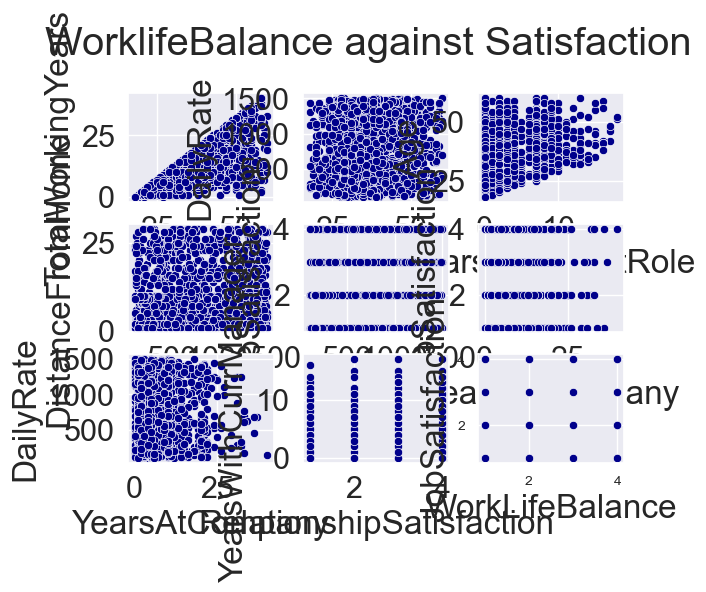

In [133]:
#확인하고 싶은 attrition 컬럼들의 산포도 확인

sns.set

f, ax = plt.subplots(ncols=3, nrows=3)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)


sns.scatterplot(x='Age', y='TotalWorkingYears', data=attrition, ax=ax[0,0], color=['darkblue'])
plt.suptitle('Age against Total working years', y=1.02)

sns.scatterplot(x='Age', y='DailyRate', data=attrition, ax=ax[0,1], color=['darkblue'])
plt.suptitle('Age against Daily Rate', y=1.02)

sns.scatterplot(x='YearsInCurrentRole', y='Age', data=attrition, ax=ax[0,2], color=['darkblue'])
plt.suptitle('Years in role against Age', y=1.02)

sns.scatterplot(x='DailyRate', y='DistanceFromHome', data=attrition, ax=ax[1,0], color=['darkblue'])
plt.suptitle('Daily Rate against DistancefromHome', y=1.02)

sns.scatterplot(x='DailyRate', y='JobSatisfaction', data=attrition, ax=ax[1,1], color=['darkblue'])
plt.suptitle('Daily Rate against distance', y=1.02)

sns.scatterplot(x='YearsAtCompany', y='JobSatisfaction', data=attrition, ax=ax[1,2], color=['darkblue'])
plt.suptitle('Years At Company against Job satisfaction', y=1.02)

sns.scatterplot(x='YearsAtCompany', y='DailyRate', data=attrition, ax=ax[2,0], color=['darkblue'])
plt.suptitle('Years at company against Daily Rate', y=1.02)

sns.scatterplot(x='RelationshipSatisfaction', y='YearsWithCurrManager', data=attrition, ax=ax[2,1], color=['darkblue'])
plt.suptitle('Relationship Satisfaction vs years with manager', y=1.02)

sns.scatterplot(x='WorkLifeBalance', y='JobSatisfaction', data=attrition, ax=ax[2,2], color=['darkblue'])
plt.suptitle('WorklifeBalance against Satisfaction', y=1.02)

plt.show()

In [ ]:
#age-totalworkingyears : 양의 상관관계
#age-daily rate
#yearsincurrentrole - age
#dailyrate - distancefromhome
#dailyrate - jobsatisfaction
#yearsatcompany - jobsatisfaction
#yearsatcompany - dailyrate
#relationshipsatisfaction - yearswithcurrmanager
#worklifebalance - jobsatisfaction : balance가 잘 맞는만큼 job만족도가 높다

In [29]:
#각 컬럼들끼리의 상관관계 분석

corr = attrition.corr()
corr_greater_than_70 = corr[corr > .70]
corr_greater_than_70

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DailyRate,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DistanceFromHome,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Education,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EmployeeCount,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EmployeeNumber,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EnvironmentSatisfaction,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HourlyRate,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
JobInvolvement,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
JobLevel,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,...,NaN,NaN,NaN,0.782208,NaN,NaN,NaN,NaN,NaN,NaN


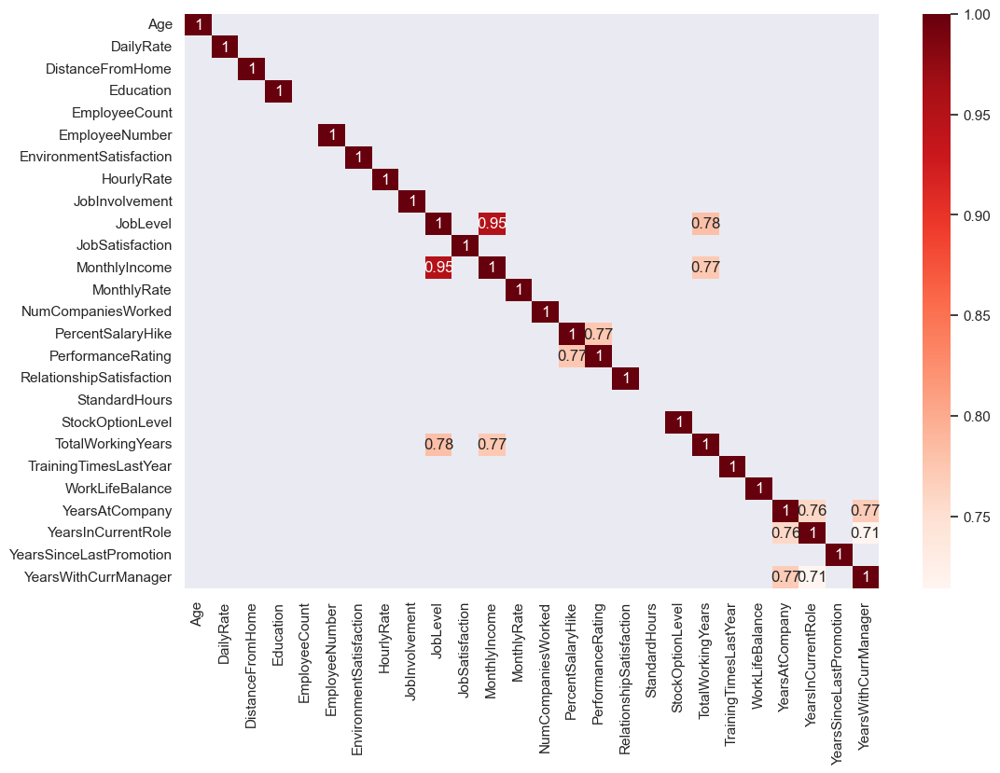

In [31]:
import seaborn as sns

plt.figure(figsize = (12,8))
sns.heatmap(corr_greater_than_70, cmap = 'Reds', annot = True);

In [ ]:
#70% 이상의 상관관계를 가지고 있는 변수들
#monthly income - job level 0.95
#total working years - job level 0.78
#total working years - monthly income 0.77

#years at company - years with currmanager 0.77
#years at company - years in current role 0.76

## 엔지니어링 & 카테고리 타입 인코딩

In [135]:
#타겟 맵핑을 위해 attrition 이라는 칼럼을 추가하고 거기에 yes/no 맵핑
target_map = {'Yes':1, 'No':0}

attrition["Attrition_numerical"] = attrition["Attrition"].apply(lambda x: target_map[x])

In [136]:
attrition.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 36 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [137]:
# numerical 변수 따로 집합 생성

numerical = [u'Age', u'DailyRate',  u'JobSatisfaction',
       u'MonthlyIncome', u'PerformanceRating',
        u'WorkLifeBalance', u'YearsAtCompany', u'Attrition_numerical']

In [138]:
#카테고리 타입을 인코딩하기 위해 numerical 변수는 빼준다

attrition["Attrition_numerical"] = attrition["Attrition"].apply(lambda x: target_map[x])
attrition = attrition.drop(['Attrition_numerical'], axis=1)

In [139]:
# Empty list to store columns with categorical data
categorical = []
for col, value in attrition.iteritems():
    if value.dtype == 'object':
        categorical.append(col)

# numerical 열들은 numerical 리스트에 저장
numerical = attrition.columns.difference(categorical)

In [140]:
#categorical 데이터는 attrition_cat이라는 데이터 프레임에 저장

attrition_cat = attrition[categorical]
attrition_cat = attrition_cat.drop(['Attrition'], axis=1)

In [148]:
#get_dummies 메서드
#사용할 데이터 프레임을 생성 -> get_dummies처리를 하면 결측값을 제외하고 0과 1로 구성된 더미값이 만들어진다
#dummy_na=True라는 옵션을 걸면 nan을 생성하여 결측값도 인코딩하여 처리 가능


attrition_cat = pd.get_dummies(attrition_cat)
attrition_cat.head(10)
attrition_cat.tail(10) #모든 값에 categorical 값이 존재하는지 여부를 1,0으로 표시

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,...,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes
1460,0,0,1,0,1,0,0,0,0,1,...,0,1,0,0,0,0,1,1,1,0
1461,0,0,1,0,0,1,0,0,1,0,...,0,0,1,0,1,0,0,1,0,1
1462,0,0,1,0,0,1,0,0,1,0,...,0,0,1,0,0,1,0,1,1,0
1463,1,0,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,1,1,1,0
1464,0,0,1,0,0,1,0,0,0,0,...,0,0,0,1,0,0,1,1,1,0
1465,0,1,0,0,1,0,0,0,0,1,...,0,0,0,0,0,1,0,1,1,0
1466,0,0,1,0,1,0,0,0,0,1,...,0,0,0,0,0,1,0,1,1,0
1467,0,0,1,0,1,0,0,1,0,0,...,0,0,0,0,0,1,0,1,0,1
1468,0,1,0,0,0,1,0,0,0,1,...,0,0,1,0,0,1,0,1,1,0
1469,0,0,1,0,1,0,0,0,0,1,...,0,0,0,0,0,1,0,1,1,0


회귀분석은 숫자로 이루어진 데이터만을 입력해야하기 때문에 문자를 숫자로 바꾸어주는 One-Hot Encoding 방법 사용
-> 가변수 (dummy variable)로 만들어 줌 (0과 1로 이루어진 열)
    - 1은 있다
    - 0은 없다

#기본형식
pandas.get_dummies(data, prefix=None, prefix_sep='_', dummy_na=False, columns=None, sparse=False, drop_first=False, dtype=None)